In [4]:
import torchvision
from torch import nn,utils
import torch.optim as optim
import torch
from torchsummary import summary 
import pandas as pd 
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from sklearn.metrics import confusion_matrix
import seaborn as sns

from dataset_builder import *
from model_train_val import *

import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
#warnings.filterwarnings('libpng warning: iCCP: known incorrect sRGB profile')

import pprint

from sklearn.metrics import classification_report

import os
from dask import bag
from dask import diagnostics

import cv2

In [5]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# A. EDA on Image Dataset

## A1.1. Class Balance 

Identifying class imbalance is an easy first step. We’re going to find the number of images assigned to each class and plot them in a bar chart to easily identify any imbalance. Imbalance in a CNN could result in poor performance for the class with less representation, impacting overall performance.

First, we’ll need to create a dictionary with class name as key and number of images as the value. Below we’re pulling number of images straight from the folders in which they’re stored.

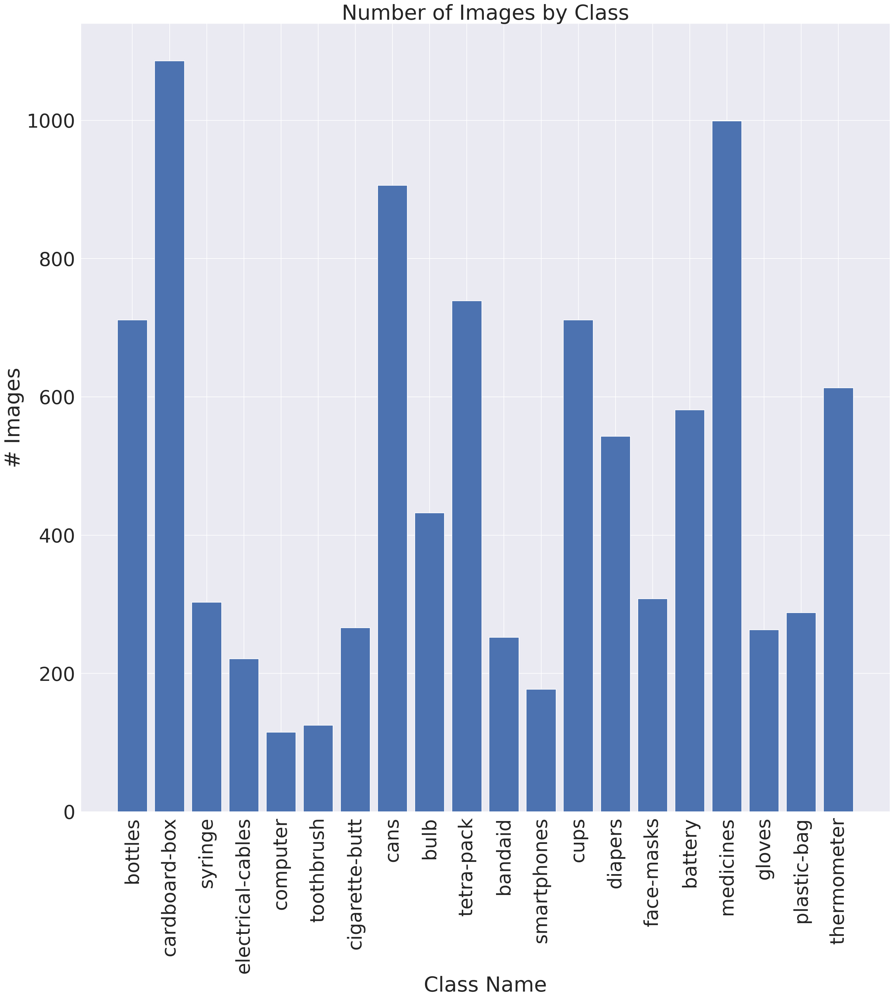

In [143]:
number_classes
fin_direc = [direc for root,direc,files in os.walk('./all_data_simply/')]
fin_direc = fin_direc[0]
fin_direc.remove('organic')
fin_direc.remove('paper')
number_classes = {}

for class_temp in fin_direc:
    number_classes[class_temp] = len(os.listdir('./all_data_simply/'+class_temp))

number_classes

plt.figure(figsize=(25,25));
plt.bar(number_classes.keys(), number_classes.values());
plt.title("Number of Images by Class");
plt.xlabel('Class Name');
plt.ylabel('# Images');
plt.xticks(rotation = 90);

## A1.2. Plotting Image Size

Consistent image size is crucial for deep learning, mismatched matrices will bring your project to a quick stop. Visualizing raw image size can also help you understand your dataset better.

We’re going to create another simple dictionary — you could create one dictionary to use for the chart above as well as below, but I wanted to show a different option that doesn’t require variables for each folder directory. We’re also going to set up a function that will return image dimensions.

libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng error: bad adaptive filter value
libpng warning: iCCP: extra compressed data
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: cHRM: inconsistent chromaticities
libpng warning: iCCP: known incorrect sRGB profile


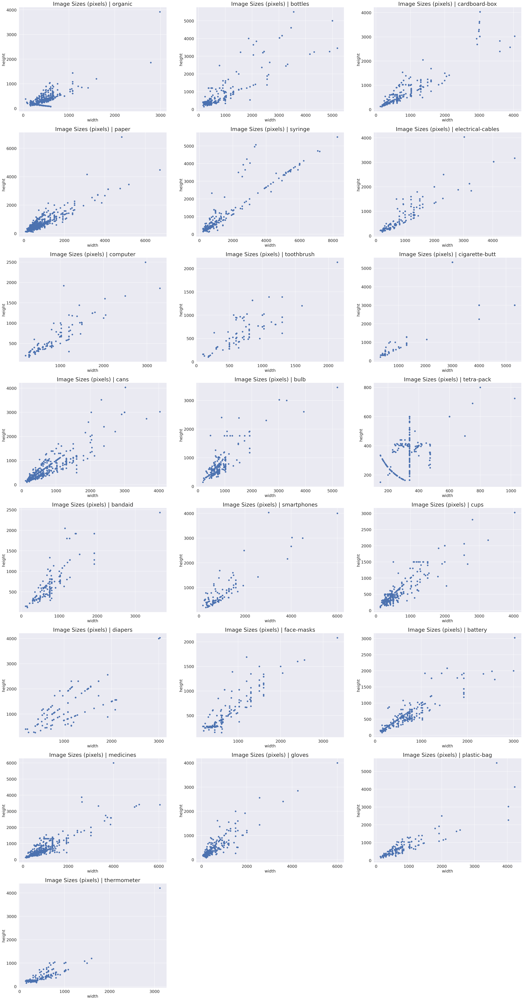

In [195]:
fin_direc = [direc for root,direc,files in os.walk('./all_data_simply/')]
fin_direc = fin_direc[0]
#fin_direc.remove('organic')

directories = {}

for class_temp in fin_direc:
    directories[class_temp] = './all_data_simply/'+class_temp+'/'

plt.figure(figsize=(40,80));

count_dir = 1

complete_dict = {}
for n,d in directories.items():
    filepath = d
    filelist = [filepath + f for f in os.listdir(filepath)]
    height = []
    width = []
    for files in filelist:
        img = cv2.imread(files)
        if img is not None:
            dimensions = img.shape
            height.append(dimensions[0])
            width.append(dimensions[1])
    
    plt.subplot(8,3,count_dir)
    plt.scatter(x=width, y=height);
    plt.title('Image Sizes (pixels) | {}'.format(n),fontsize=24)
    plt.xlabel("width", fontsize=18)
    plt.xticks(fontsize=18)
    plt.ylabel("height", fontsize=18)
    plt.yticks(fontsize=18)
    
    count_dir = count_dir + 1

## A1.3. Transformations

Data transformation techniques (rotation, flip, crop, etc.) that can change the images’ pixel values but still keep almost the whole information of the image, so that human could hardly tell whether it was augmented or not. This forces the model to be more flexible with the large variation of object inside the image, regarding less on position, orientation, size, color,

Models trained with data augmentation usually generalize better but the remaining question is what Data Transformations have the best impact for our waste classifcation models.

Let’s take a look at some Data transformation techniques supporting by Pytorch in Torchvision that can help you to conduct augmentation on your ơn images.

In [6]:
from PIL import Image
from pathlib import Path
import torchvision.transforms as T

orig_img = Image.open('paper_cup_2.jpg')
# if you change the seed, make sure that the randomly-applied transforms
# properly show that the image can be both transformed and *not* transformed!
def plot(imgs, with_orig=True, row_title=None, **imshow_kwargs):
    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()

### 1. Resize

torchvision.transforms.Resize(size) -> Resize the input image to the given size. If the image is torch Tensor, it is expected to have […, H, W] shape, where … means an arbitrary number of leading dimensions

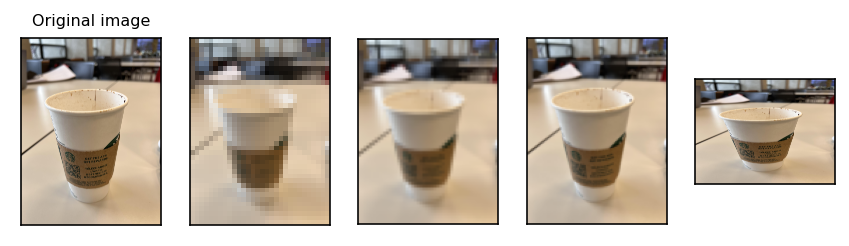

In [7]:
resized_imgs = [T.Resize(size=size)(orig_img) for size in (30, 50, 100, orig_img.size)]
plot(resized_imgs)

### 2. Center Crop
torchvision.transforms.CenterCrop(size) ->
It’s similar to zooming in the center of image. It will crop the given image to a desired output size and position (size can be square or rectangle).

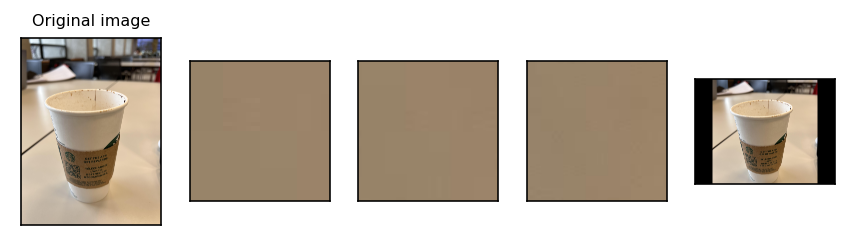

In [8]:
center_crops = [T.CenterCrop(size=size)(orig_img) for size in (30, 50, 100, orig_img.size)]
plot(center_crops)

### 3. Grayscale
torchvision.transforms.Grayscale(num_output_channels)-> Convert image to grayscale. It’s sometimes helpful for CNN model to train faster with single channel and to learn more easily the pattern of images.

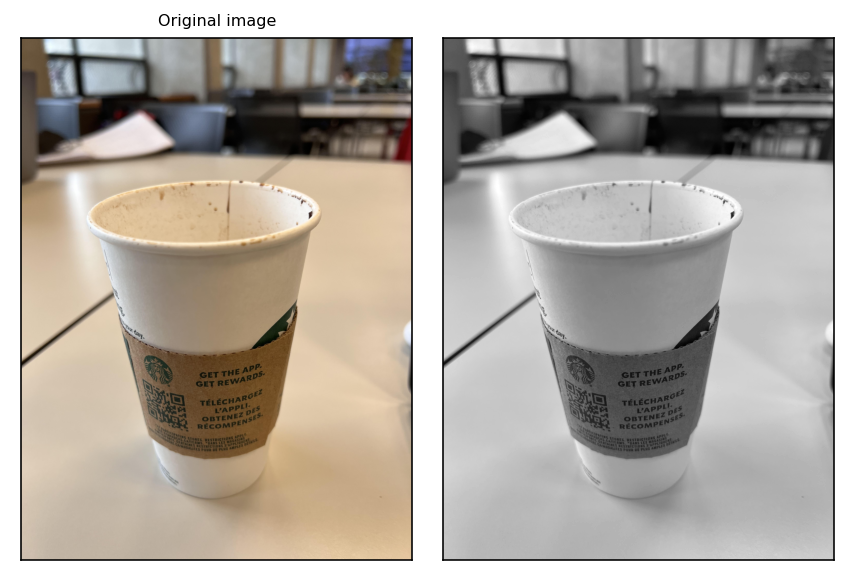

In [9]:
gray_img = T.Grayscale()(orig_img)
plot([gray_img], cmap='gray')

#### 4. Random Rotation

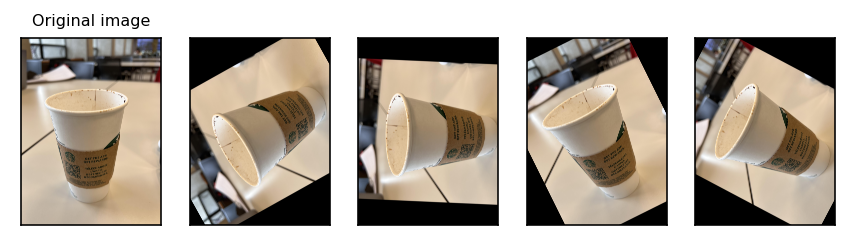

In [10]:
rotater = T.RandomRotation(degrees=(0, 180))
rotated_imgs = [rotater(orig_img) for _ in range(4)]
plot(rotated_imgs)

### 5. Random Crop
torchvision.transforms.RandomCrop(size, padding)-> this function will crop the given image at random locations to create a bunch of images for training.

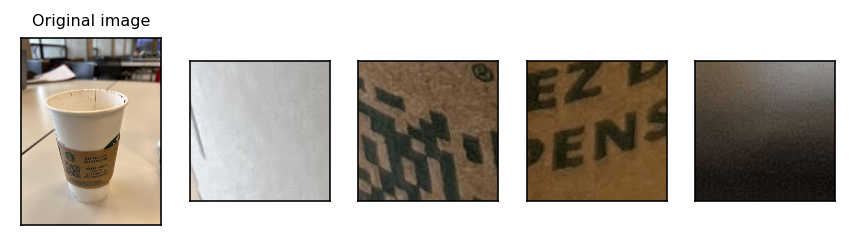

In [11]:
cropper = T.RandomCrop(size=(128, 128))
crops = [cropper(orig_img) for _ in range(4)]
plot(crops)

### 6. Normalize

torchvision.transforms.Normalize(mean, std)-> Normalize a tensor image with mean and standard deviation. It will help the CNN model to easily convert to global minimum or quickly reduce the loss.

In [12]:
normalizer = T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

Many Deep-ML practitioners meet this problem, they usually did transform before checking how well their model can learn from their original image. If the model is underfitting the original image, transforming data wasn’t help to solve the problem, in other words, it will decrease the accuracy of your model. In case of overfitting, it will avoid the overfitting problem as well as to increase the number of training data for the CNN model.

Therefore, we have to do step by step to diagnose our model and analysis the results that are visualized.

For our case, this is what we came up with after several runs on multiple models.

### Our transformation pipeline:

<hr>


``` python
transform = transforms.Compose([
        transforms.Resize((256,256)),
        transforms.Grayscale(num_output_channels=3),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    
```

# B. Model Comparisons

In [11]:
model_vgg = torch.load('./models/model_vgg_all_simply.pt')
model_vgg.eval()

model_resnet18= torch.load('./models/resnet18_blue_black.pt')
model_resnet18.eval()

model_inceptionv3= torch.load('./models/inceptionv3.pt')
model_inceptionv3.eval()

model_squeeze_net= torch.load('./models/squeezeNet.pt')
model_squeeze_net.eval()

print()

## B.1 Model Summaries

The summary is textual and includes information about:

The layers and their order in the model.
The output shape of each layer.
The number of parameters (weights) in each layer.
The total number of parameters (weights) in the model.

In [12]:
summary(model_vgg, (3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

In [13]:
summary(model_resnet18, (3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
       BasicBlock-11           [-1, 64, 64, 64]               0
           Conv2d-12           [-1, 64, 64, 64]          36,864
      BatchNorm2d-13           [-1, 64, 64, 64]             128
             ReLU-14           [-1, 64,

In [14]:
summary(model_inceptionv3, (3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
          Upsample-1          [-1, 3, 512, 512]               0
            Conv2d-2         [-1, 32, 255, 255]             864
       BatchNorm2d-3         [-1, 32, 255, 255]              64
       BasicConv2d-4         [-1, 32, 255, 255]               0
            Conv2d-5         [-1, 32, 253, 253]           9,216
       BatchNorm2d-6         [-1, 32, 253, 253]              64
       BasicConv2d-7         [-1, 32, 253, 253]               0
            Conv2d-8         [-1, 64, 253, 253]          18,432
       BatchNorm2d-9         [-1, 64, 253, 253]             128
      BasicConv2d-10         [-1, 64, 253, 253]               0
        MaxPool2d-11         [-1, 64, 126, 126]               0
           Conv2d-12         [-1, 80, 126, 126]           5,120
      BatchNorm2d-13         [-1, 80, 126, 126]             160
      BasicConv2d-14         [-1, 80, 1

In [15]:
summary(model_squeeze_net, (3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 96, 125, 125]          14,208
              ReLU-2         [-1, 96, 125, 125]               0
         MaxPool2d-3           [-1, 96, 62, 62]               0
            Conv2d-4           [-1, 16, 62, 62]           1,552
              ReLU-5           [-1, 16, 62, 62]               0
            Conv2d-6           [-1, 64, 62, 62]           1,088
              ReLU-7           [-1, 64, 62, 62]               0
            Conv2d-8           [-1, 64, 62, 62]           9,280
              ReLU-9           [-1, 64, 62, 62]               0
             Fire-10          [-1, 128, 62, 62]               0
           Conv2d-11           [-1, 16, 62, 62]           2,064
             ReLU-12           [-1, 16, 62, 62]               0
           Conv2d-13           [-1, 64, 62, 62]           1,088
             ReLU-14           [-1, 64,

In [ ]:
str_temp = vgg16_all_simply_val_train_loss
vgg16_all_simply_train_loss = []
vgg16_all_simply_train_acc = []
vgg16_all_simply_val_loss = []
vgg16_all_simply_val_acc = []
for epoch_train in range(0,25):
    num_index = str_temp.find("train")

    vgg16_all_simply_train_loss.append(float(str_temp[num_index+12:num_index+19]))
    vgg16_all_simply_train_acc.append(float(str_temp[num_index+24:num_index+30]))

    num_index = str_temp.find("val")
    
    vgg16_all_simply_val_loss.append(float(str_temp[num_index+10:num_index+16]))
    vgg16_all_simply_val_acc.append(float(str_temp[num_index+22:num_index+28]))
    
    
    str_temp = str_temp[num_index+1:]

print("train_loss")
print(vgg16_all_simply_train_loss)

print("train_acc")
print(vgg16_all_simply_train_acc)

print("val_loss")
print(vgg16_all_simply_val_loss)

print("val_acc")
print(vgg16_all_simply_val_acc)


In [16]:
vgg16_all_simply_train_loss = [0.6073, 0.4739, 0.4505, 0.4338, 0.3803, 0.3957, 0.3808, 0.2992, 0.2736, 0.2716, 0.2579, 0.2396, 0.2576, 0.243, 0.2279, 0.2262, 0.2234, 0.2361, 0.2344, 0.2309, 0.2251, 0.2235, 0.2313, 0.2392, 0.2312]
vgg16_all_simply_train_acc = [0.8338, 0.8724, 0.8804, 0.8903, 0.9007, 0.8979, 0.901, 0.9189, 0.9235, 0.9239, 0.9273, 0.9298, 0.927, 0.9273, 0.9321, 0.9324, 0.9317, 0.9284, 0.9292, 0.9306, 0.9332, 0.9336, 0.9318, 0.9306, 0.9318]
vgg16_all_simply_val_loss = [0.4, 0.3804, 0.3528, 0.3575, 0.3868, 0.3827, 0.3826, 0.3366, 0.3298, 0.3223, 0.3187, 0.317, 0.3119, 0.3113, 0.3108, 0.3101, 0.3099, 0.309, 0.3094, 0.3093, 0.3087, 0.3086, 0.3086, 0.3086, 0.3085]
vgg16_all_simply_val_acc = [0.8869, 0.8931, 0.9046, 0.9065, 0.9034, 0.9047, 0.9066, 0.9173, 0.9176, 0.9193, 0.9181, 0.9164, 0.9206, 0.9189, 0.919, 0.9196, 0.9192, 0.9195, 0.919, 0.9184, 0.9186, 0.9186, 0.919, 0.919, 0.9196]


resnet_18_train_loss = [1.4724, 1.0259, 0.9368, 0.9053, 0.8684, 0.8469, 0.8543, 0.732, 0.71, 0.7294, 0.7151, 0.7053, 0.6994, 0.7063, 0.7115, 0.6801, 0.6932, 0.6989, 0.7091, 0.6942, 0.6971, 0.6919, 0.6934, 0.6919, 0.6947]
resnet_18_train_acc = [0.5789, 0.6955, 0.7229, 0.729, 0.7378, 0.7441, 0.743, 0.7819, 0.785, 0.7759, 0.7813, 0.7839, 0.785, 0.782, 0.783, 0.7927, 0.7904, 0.7847, 0.7833, 0.7865, 0.7906, 0.7913, 0.7931, 0.7934, 0.7901]
resnet_18_val_loss = [0.6512, 0.5866, 0.5193, 0.5741, 0.533, 0.4975, 0.5711, 0.4959, 0.4811, 0.4953, 0.4675, 0.4892, 0.4926, 0.4995, 0.4574, 0.4558, 0.4889, 0.4752, 0.4729, 0.5065, 0.4876, 0.463, 0.5139, 0.502, 0.4468]
resnet_18_val_acc = [0.7956, 0.823, 0.845, 0.8299, 0.845, 0.856, 0.845, 0.8557, 0.8589, 0.8541, 0.8632, 0.8511, 0.8546, 0.8568, 0.8645, 0.8637, 0.8552, 0.86, 0.8605, 0.8519, 0.8568, 0.8605, 0.849, 0.857, 0.8675]


inceptionv3_train_loss = [1.8143, 1.6003, 1.5567, 1.5351, 1.5125, 1.5104, 1.5195, 1.4406, 1.4279, 1.4236, 1.4129, 1.4075, 1.4006, 1.3932, 1.3898, 1.3837, 1.3968, 1.3817, 1.3877, 1.3851, 1.3938, 1.3754, 1.3929, 1.3652, 1.3698]
inceptionv3_train_acc = [0.4929, 0.5398, 0.5482, 0.5579, 0.5626, 0.5676, 0.5608, 0.5791, 0.5851, 0.5821, 0.5887, 0.5873, 0.5884, 0.5911, 0.5925, 0.5926, 0.5908, 0.594, 0.5941, 0.5951, 0.5927, 0.5955, 0.5918, 0.6035, 0.5967]
inceptionv3_val_loss = [1.027, 0.9109, 0.8704, 0.8441, 0.8343, 0.855, 0.8208, 0.7877, 0.7905, 0.7976, 0.7722, 0.7844, 0.7768, 0.7751, 0.7785, 0.7806, 0.7675, 0.7723, 0.7864, 0.8017, 0.7755, 0.7929, 0.7863, 0.7699, 0.7901]
inceptionv3_val_acc = [0.7087, 0.7351, 0.7505, 0.7481, 0.7576, 0.7463, 0.7576, 0.7619, 0.768, 0.7622, 0.7738, 0.7701, 0.7695, 0.7647, 0.7708, 0.7705, 0.7689, 0.7689, 0.7674, 0.765, 0.7704, 0.7696, 0.7719, 0.7734, 0.77]


squeeze_net_train_loss = [1.2137, 0.9528, 0.8796, 0.8445, 0.8237, 0.8035, 0.788, 0.6617, 0.637, 0.6331, 0.6229, 0.6138, 0.6145, 0.6142, 0.5998, 0.593, 0.5938, 0.595, 0.5954, 0.5907, 0.5942, 0.5919, 0.5927, 0.5911, 0.5934]
squeeze_net_train_acc = [0.6771, 0.7334, 0.7548, 0.7623, 0.7661, 0.7711, 0.7764, 0.8065, 0.814, 0.8149, 0.8161, 0.8168, 0.8189, 0.8172, 0.8211, 0.8232, 0.8252, 0.8238, 0.8236, 0.8234, 0.8249, 0.8234, 0.8239, 0.8237, 0.8234]
squeeze_net_val_loss = [1.213, 1.0722, 1.0477, 1.032, 1.0575, 1.0279, 1.0278, 0.9405, 0.9125, 0.9038, 0.8966, 0.8875, 0.8763, 0.8701, 0.8611, 0.8582, 0.8588, 0.8579, 0.8542, 0.8557, 0.856, 0.8561, 0.8561, 0.8557, 0.8551]
squeeze_net_val_acc = [0.695, 0.7291, 0.7336, 0.7353, 0.7309, 0.7394, 0.7428, 0.7578, 0.7603, 0.7593, 0.7605, 0.763, 0.7651, 0.7658, 0.7668, 0.7692, 0.7675, 0.7669, 0.7682, 0.7673, 0.7667, 0.7667, 0.7669, 0.7671, 0.767]

## B.2 Model Accuracies

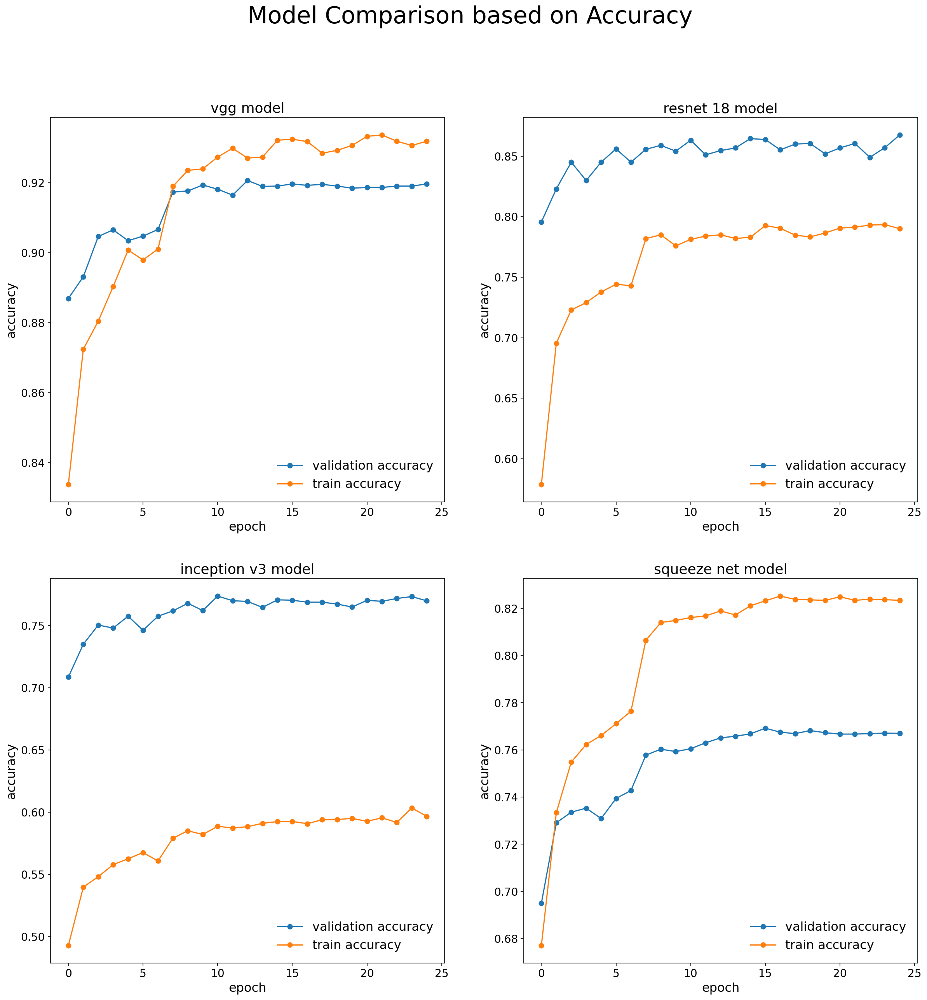

In [17]:
def plot_accuracies(val_acc, train_acc, model,ax=None):
    ax.plot(val_acc, '-o',label='validation accuracy')
    ax.plot(train_acc, '-o',label='train accuracy')
    ax.set_xlabel('epoch',fontsize=16)
    ax.set_ylabel('accuracy',fontsize=16)
    ax.xaxis.set_tick_params(labelsize=14)
    ax.yaxis.set_tick_params(labelsize=14)
    ax.legend(loc='lower right',fontsize=16,frameon=False) #'validation accuracy', 'train accuracy')
    ax.set_title(model,fontsize=18);
    #plt.show();

fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize=(20,20))

fig.suptitle("Model Comparison based on Accuracy", fontsize=30)

plot_accuracies(vgg16_all_simply_val_acc, vgg16_all_simply_train_acc,'vgg model',ax=ax1)
plot_accuracies(resnet_18_val_acc, resnet_18_train_acc,'resnet 18 model',ax=ax2)
plot_accuracies(inceptionv3_val_acc, inceptionv3_train_acc, 'inception v3 model',ax=ax3)
plot_accuracies(squeeze_net_val_acc, squeeze_net_train_acc, 'squeeze net model',ax=ax4)

## B.3. Model Losses

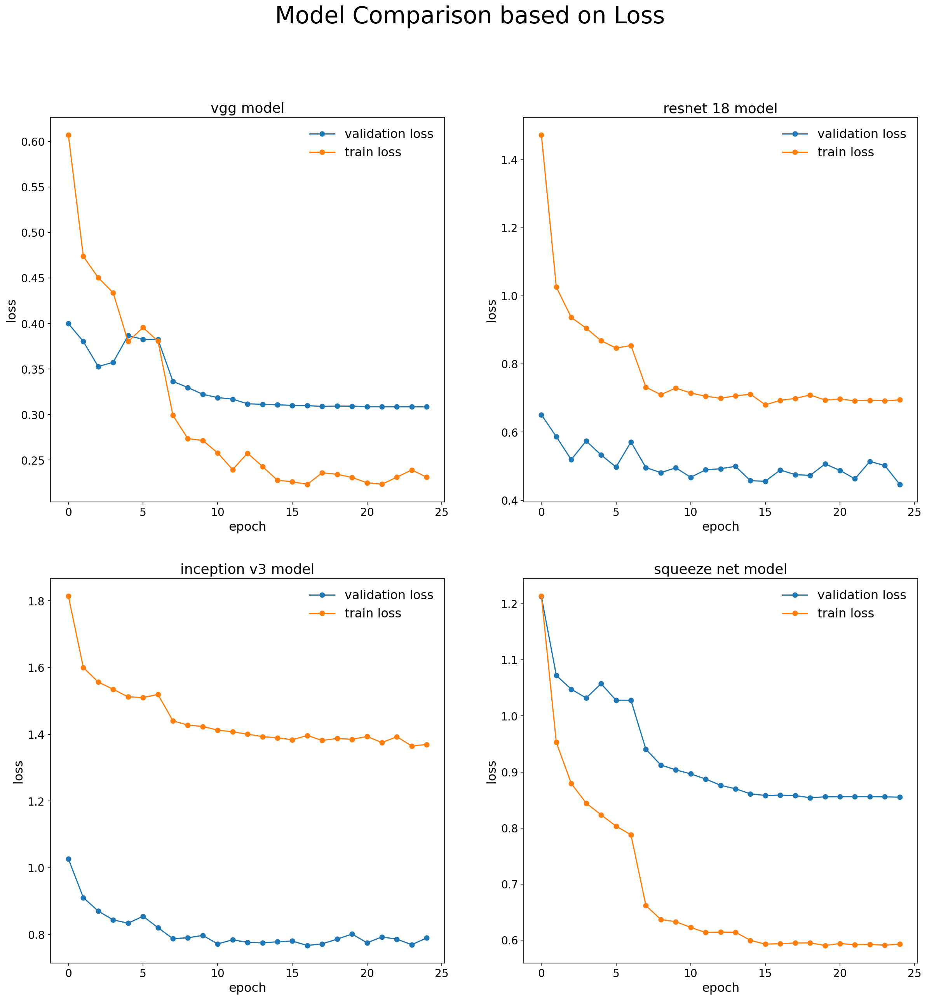

In [18]:
def plot_losses(val_loss, train_loss, model,ax=None):
    ax.plot(val_loss, '-o',label='validation loss')
    ax.plot(train_loss, '-o',label='train loss')
    ax.set_xlabel('epoch',fontsize=16)
    ax.set_ylabel('loss',fontsize=16)
    ax.xaxis.set_tick_params(labelsize=14)
    ax.yaxis.set_tick_params(labelsize=14)
    ax.legend(loc='upper right',fontsize=16, frameon=False) #'validation accuracy', 'train accuracy')
    ax.set_title(model,fontsize=18);
    #plt.show();

fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize=(20,20))

fig.suptitle("Model Comparison based on Loss", fontsize=30)

plot_losses(vgg16_all_simply_val_loss, vgg16_all_simply_train_loss,'vgg model',ax=ax1)
plot_losses(resnet_18_val_loss, resnet_18_train_loss,'resnet 18 model',ax=ax2)
plot_losses(inceptionv3_val_loss, inceptionv3_train_loss, 'inception v3 model',ax=ax3)
plot_losses(squeeze_net_val_loss, squeeze_net_train_loss, 'squeeze net model',ax=ax4)

# C.1. VGG Model Analysis

In [46]:
# Testing the model and stroring y_true and y_pred

transform = transforms.Compose([
        transforms.Resize((256,256)),
        transforms.Grayscale(num_output_channels=3),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

(all,all_dataSets,all_dataLoader) = generate_dataset('./all_data_simply',transform,0.3)
#print(all_dataLoader['val'])
y_pred = []
y_true = []


# iterate over test data
for inputs, labels in all_dataLoader['val']:
        inputs,labels = inputs.to(device), labels.to(device)
        output = model_vgg(inputs) # Feed Network

        output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
        y_pred.extend(output) # Save Prediction
        
        labels = labels.data.cpu().numpy()
        y_true.extend(labels) # Save Truth
classes = all.classes
all_dataset_sizes = len(all)

## C1.1. Classification Report

**Precision**<br>
What percent of your predictions were correct?<br><br>
**Recall**<br>
What percent of the positive cases did you catch?<br><br>
**F1 score**<br>
What percent of positive predictions were correct?<br><br>
**Support**<br>
Support is the number of actual occurrences of the class in the specified dataset. Imbalanced support in the training data may indicate structural weaknesses in the reported scores of the classifier and could indicate the need for stratified sampling or rebalancing.


In [47]:
pd.DataFrame(classification_report(y_true, y_pred, target_names= all.classes,output_dict=True)).T

,precision,recall,f1-score,support
bandaid,0.876404,0.928571,0.901734,84.000000
battery,0.953125,0.989189,0.970822,185.000000
bottles,0.995146,0.980861,0.987952,209.000000
bulb,0.975610,0.975610,0.975610,123.000000
cans,0.968254,0.964427,0.966337,253.000000
cardboard-box,0.902821,0.920128,0.911392,313.000000
cigarette-butt,0.941176,0.952381,0.946746,84.000000
computer,0.972973,0.972973,0.972973,37.000000
cups,0.977064,0.963801,0.970387,221.000000
diapers,0.961749,0.977778,0.969697,180.000000


## C.1.2. Accuracy of each class

In [48]:
from sklearn.metrics import confusion_matrix
final_acc = []
cf_matrix = confusion_matrix(y_true,y_pred)
confusion_matrix = torch.from_numpy(cf_matrix)
class_acu = (confusion_matrix.diag()/confusion_matrix.sum(1)).numpy()
for acc_class in class_acu:
    final_acc.append(f"{acc_class*100:.2f} %")
#sn.set_theme(style="whitegrid")
pd.DataFrame(data=final_acc,index=all.classes, columns=["Accuracy"])

,Accuracy
bandaid,92.86 %
battery,98.92 %
bottles,98.09 %
bulb,97.56 %
cans,96.44 %
cardboard-box,92.01 %
cigarette-butt,95.24 %
computer,97.30 %
cups,96.38 %
diapers,97.78 %


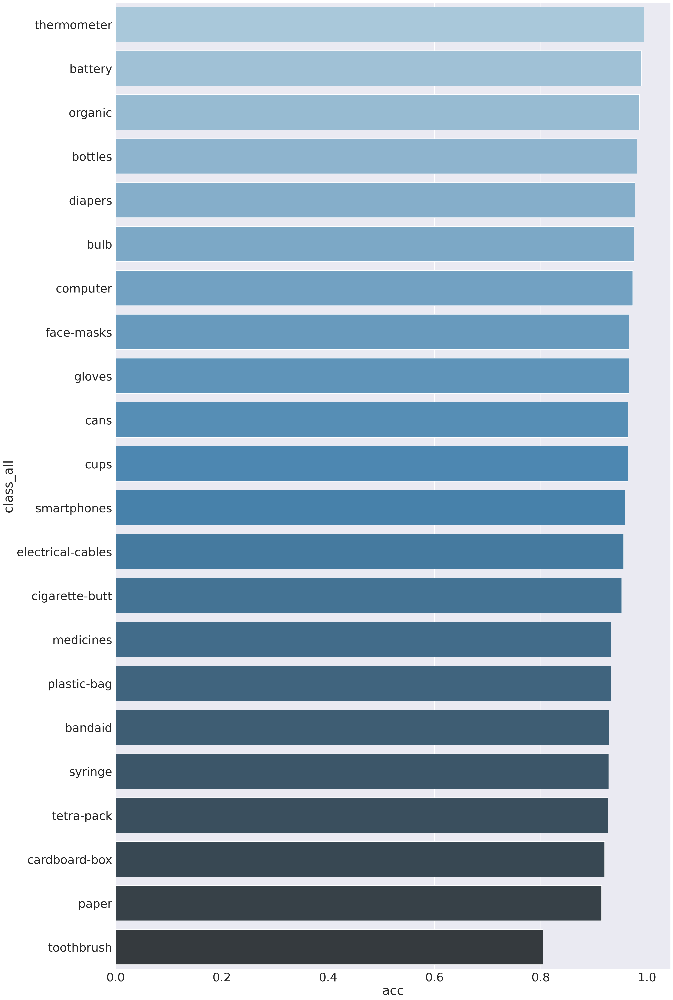

In [49]:
#sn.set_theme(style="darkgrid")
sns.set(rc={'figure.figsize':(28,50)})
sns.set(font_scale = 3)
df_acc_class = pd.DataFrame(data=[class_acu,all.classes]).T
df_acc_class = df_acc_class.rename(columns={0: 'acc', 1: 'class_all'})
ax = sns.barplot(x=df_acc_class['acc'], y=df_acc_class['class_all'],palette="Blues_d",order=df_acc_class.sort_values('acc',ascending = False).class_all)
df_model_vgg = df_acc_class

## C.1.3. Confusion Matrix for VGG

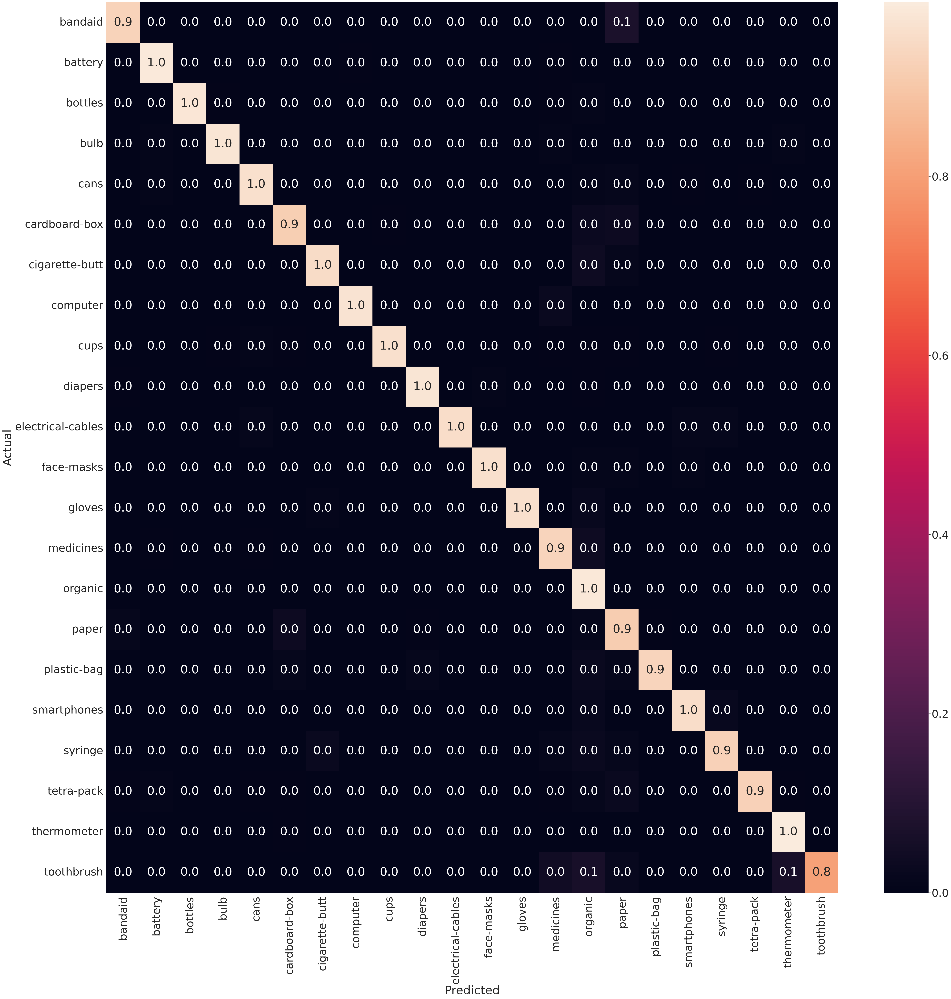

In [50]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
# Normalise
sns.set(font_scale = 3)
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(50,50))
sns.heatmap(cmn, annot=True, fmt='.1f', xticklabels=classes, yticklabels=classes)
plt.ylabel('Actual')
plt.xlabel('Predicted')

plt.savefig('model_vgg_heatmap.png')
plt.show(block=False)

# D.1 Resnet18 Analysis

In [52]:
# Testing the model and stroring y_true and y_pred 
transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

(all,all_dataSets,all_dataLoader) = generate_dataset('./blue_black_data',transform,0.3)
#print(all_dataLoader['val'])
y_pred = []
y_true = []


# iterate over test data
for inputs, labels in all_dataLoader['val']:
        inputs,labels = inputs.to(device), labels.to(device)
        output = model_resnet18(inputs) # Feed Network

        output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
        y_pred.extend(output) # Save Prediction
        
        labels = labels.data.cpu().numpy()
        y_true.extend(labels) # Save Truth
classes = all.classes
all_dataset_sizes = len(all)
print(len(classes))

26


## D1.1. Classification Report

**Precision**<br>
What percent of your predictions were correct?<br><br>
**Recall**<br>
What percent of the positive cases did you catch?<br><br>
**F1 score**<br>
What percent of positive predictions were correct?<br><br>
**Support**<br>
Support is the number of actual occurrences of the class in the specified dataset. Imbalanced support in the training data may indicate structural weaknesses in the reported scores of the classifier and could indicate the need for stratified sampling or rebalancing.

In [53]:
pd.DataFrame(classification_report(y_true, y_pred, target_names= all.classes,output_dict=True)).T

,precision,recall,f1-score,support
bandaid,0.775000,0.837838,0.805195,74.000000
battery,0.885417,0.949721,0.916442,179.000000
bulb,0.878378,0.921986,0.899654,141.000000
cans,0.893443,0.825758,0.858268,264.000000
cardboard-box,0.859873,0.879479,0.869565,307.000000
cigarette-butt,0.952941,0.910112,0.931034,89.000000
computer,0.804878,0.916667,0.857143,36.000000
diapers,0.937143,0.982036,0.959064,167.000000
electrical-cables,0.788732,0.903226,0.842105,62.000000
face-masks,0.945055,0.977273,0.960894,88.000000


## D1.2. Accuracy for each class

In [54]:
from sklearn.metrics import confusion_matrix
final_acc = []
cf_matrix = confusion_matrix(y_true,y_pred)
confusion_matrix = torch.from_numpy(cf_matrix)
class_acu = (confusion_matrix.diag()/confusion_matrix.sum(1)).numpy()
for acc_class in class_acu:
    final_acc.append(f"{acc_class*100:.2f} %")
#sn.set_theme(style="whitegrid")
pd.DataFrame(data=final_acc,index=all.classes, columns=["Accuracy"])

,Accuracy
bandaid,83.78 %
battery,94.97 %
bulb,92.20 %
cans,82.58 %
cardboard-box,87.95 %
cigarette-butt,91.01 %
computer,91.67 %
diapers,98.20 %
electrical-cables,90.32 %
face-masks,97.73 %


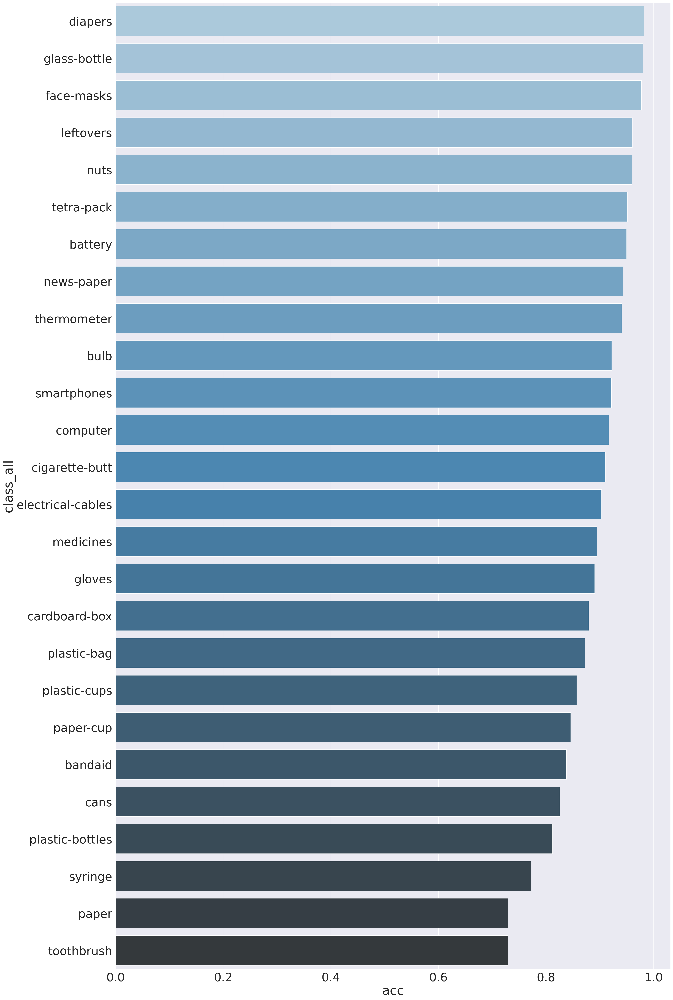

In [55]:
#sn.set_theme(style="darkgrid")
sns.set(rc={'figure.figsize':(28,50)})
sns.set(font_scale = 3)
df_acc_class = pd.DataFrame(data=[class_acu,all.classes]).T
df_acc_class = df_acc_class.rename(columns={0: 'acc', 1: 'class_all'})
ax = sns.barplot(x=df_acc_class['acc'], y=df_acc_class['class_all'],palette="Blues_d",order=df_acc_class.sort_values('acc',ascending = False).class_all)
df_model_resnet18 = df_acc_class

## D1.3. Confusion Matrix for RESNET18

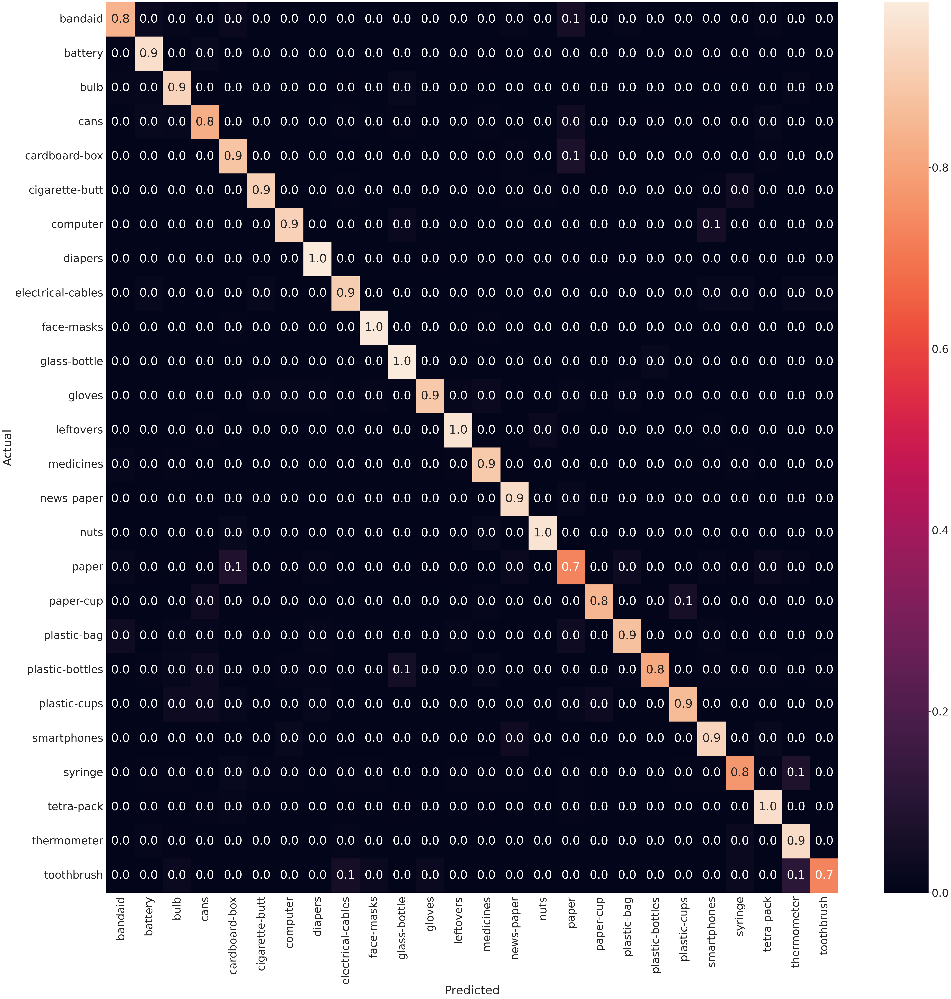

In [56]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
# Normalise
sns.set(font_scale = 3)
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(50,50))
sns.heatmap(cmn, annot=True, fmt='.1f', xticklabels=classes, yticklabels=classes)
plt.ylabel('Actual')
plt.xlabel('Predicted')

plt.savefig('model_resnet18_heatmap.png')
plt.show(block=False)

# E.1 Inception V3 Analysis

In [58]:
# Testing the model and stroring y_true and y_pred 
transform = transforms.Compose([
        transforms.RandomResizedCrop(size=256, scale=(0.8, 1.0)),
        transforms.RandomRotation(degrees=15),
        transforms.ColorJitter(),
        transforms.RandomHorizontalFlip(),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
(all,all_dataSets,all_dataLoader) = generate_dataset('./data_dim',transform,0.3)

y_pred = []
y_true = []


# iterate over test data
for inputs, labels in all_dataLoader['val']:
        inputs,labels = inputs.to(device), labels.to(device)
        output = model_inceptionv3(inputs) # Feed Network

        output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
        y_pred.extend(output) # Save Prediction
        
        labels = labels.data.cpu().numpy()
        y_true.extend(labels) # Save Truth
classes = all.classes
all_dataset_sizes = len(all)
print(len(classes))

28


## E1.1. Classification Report

**Precision**<br>
What percent of your predictions were correct?<br><br>
**Recall**<br>
What percent of the positive cases did you catch?<br><br>
**F1 score**<br>
What percent of positive predictions were correct?<br><br>
**Support**<br>
Support is the number of actual occurrences of the class in the specified dataset. Imbalanced support in the training data may indicate structural weaknesses in the reported scores of the classifier and could indicate the need for stratified sampling or rebalancing.

In [59]:
pd.DataFrame(classification_report(y_true, y_pred, target_names= all.classes,output_dict=True)).T

,precision,recall,f1-score,support
bandaid,0.595041,0.774194,0.672897,93.00000
blue-paper,0.695431,0.730667,0.712614,375.00000
bread,0.768924,0.873303,0.817797,221.00000
bulb,0.597345,0.718085,0.652174,188.00000
cardboard,0.809192,0.772606,0.790476,752.00000
cigarette-butt,0.660377,0.864198,0.748663,162.00000
diapers,0.731915,0.966292,0.832930,178.00000
e-waste,0.766160,0.763258,0.764706,1056.00000
face-masks,0.691667,0.790476,0.737778,105.00000
glass,0.802575,0.734053,0.766786,1019.00000


## E.1.2. Accuracy for each class

In [60]:
from sklearn.metrics import confusion_matrix
final_acc = []
cf_matrix = confusion_matrix(y_true,y_pred)
confusion_matrix = torch.from_numpy(cf_matrix)
class_acu = (confusion_matrix.diag()/confusion_matrix.sum(1)).numpy()
for acc_class in class_acu:
    final_acc.append(f"{acc_class*100:.2f} %")
#sn.set_theme(style="whitegrid")
pd.DataFrame(data=final_acc,index=all.classes, columns=["Accuracy"])

,Accuracy
bandaid,77.42 %
blue-paper,73.07 %
bread,87.33 %
bulb,71.81 %
cardboard,77.26 %
cigarette-butt,86.42 %
diapers,96.63 %
e-waste,76.33 %
face-masks,79.05 %
glass,73.41 %


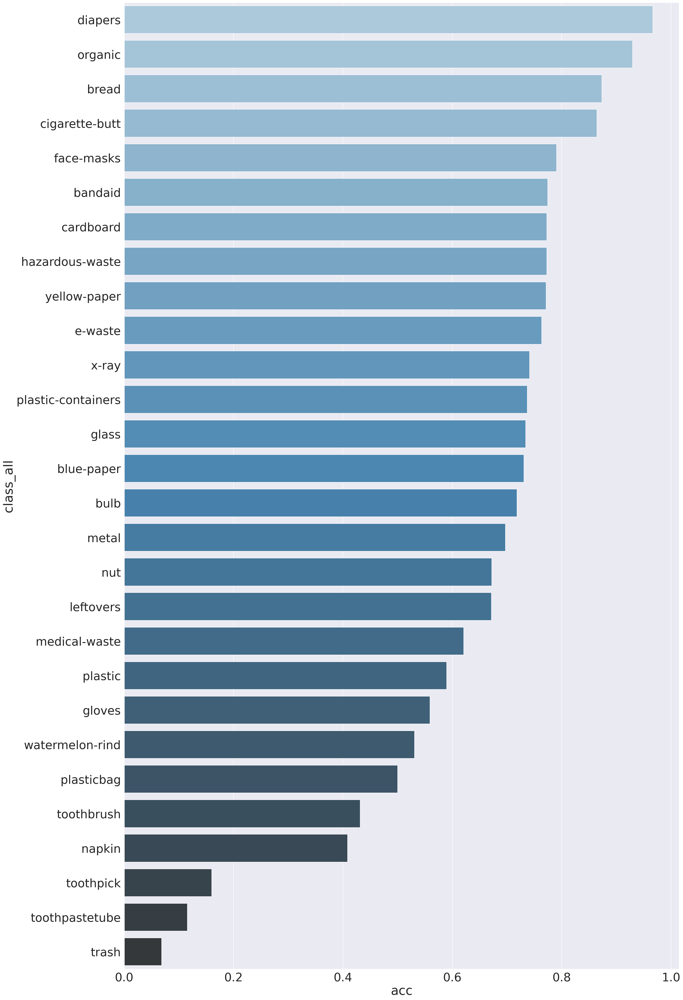

In [61]:
#sn.set_theme(style="darkgrid")
sns.set(rc={'figure.figsize':(28,50)})
sns.set(font_scale = 3)
df_acc_class = pd.DataFrame(data=[class_acu,all.classes]).T
df_acc_class = df_acc_class.rename(columns={0: 'acc', 1: 'class_all'})
ax = sns.barplot(x=df_acc_class['acc'], y=df_acc_class['class_all'],palette="Blues_d",order=df_acc_class.sort_values('acc',ascending = False).class_all)
df_model_inceptionv3 = df_acc_class

## E.1.3. Confusion Matrix for Inceptionv3 

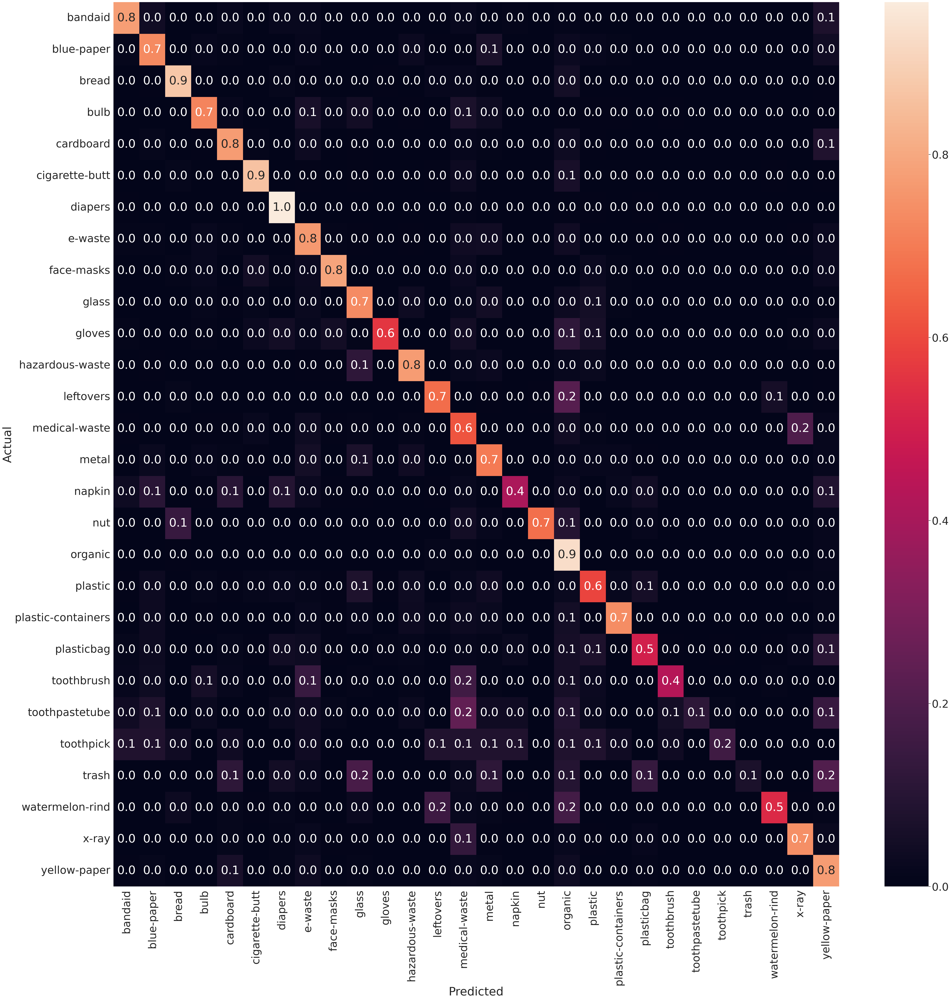

In [62]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
# Normalise
sns.set(font_scale = 3)
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(50,50))
sns.heatmap(cmn, annot=True, fmt='.1f', xticklabels=classes, yticklabels=classes)
plt.ylabel('Actual')
plt.xlabel('Predicted')

plt.savefig('model_inceptionv3_heatmap.png')
plt.show(block=False)

# E.1. Squeeze Net Analysis

In [64]:
# Testing the model and stroring y_true and y_pred 
transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

(all,all_dataSets,all_dataLoader) = generate_dataset('./data_dim',transform,0.3)

y_pred = []
y_true = []


# iterate over test data
for inputs, labels in all_dataLoader['val']:
        inputs,labels = inputs.to(device), labels.to(device)
        output = model_squeeze_net(inputs) # Feed Network

        output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
        y_pred.extend(output) # Save Prediction
        
        labels = labels.data.cpu().numpy()
        y_true.extend(labels) # Save Truth
classes = all.classes
all_dataset_sizes = len(all)
print(len(classes))

28


## E.1.1 Classification Report
**Precision**<br>
What percent of your predictions were correct?<br><br>
**Recall**<br>
What percent of the positive cases did you catch?<br><br>
**F1 score**<br>
What percent of positive predictions were correct?<br><br>
**Support**<br>
Support is the number of actual occurrences of the class in the specified dataset. Imbalanced support in the training data may indicate structural weaknesses in the reported scores of the classifier and could indicate the need for stratified sampling or rebalancing.

In [65]:
pd.DataFrame(classification_report(y_true, y_pred, target_names= all.classes,output_dict=True)).T

,precision,recall,f1-score,support
bandaid,0.605505,0.741573,0.666667,89.000000
blue-paper,0.747664,0.835509,0.789149,383.000000
bread,0.767932,0.798246,0.782796,228.000000
bulb,0.673640,0.856383,0.754098,188.000000
cardboard,0.845000,0.850314,0.847649,795.000000
cigarette-butt,0.816832,0.959302,0.882353,172.000000
diapers,0.803922,0.982036,0.884097,167.000000
e-waste,0.807860,0.756646,0.781415,978.000000
face-masks,0.704698,0.882353,0.783582,119.000000
glass,0.798354,0.784631,0.791433,989.000000


## E.1.3. Accuracy for each class

In [66]:
from sklearn.metrics import confusion_matrix
final_acc = []
cf_matrix = confusion_matrix(y_true,y_pred)
confusion_matrix = torch.from_numpy(cf_matrix)
class_acu = (confusion_matrix.diag()/confusion_matrix.sum(1)).numpy()
for acc_class in class_acu:
    final_acc.append(f"{acc_class*100:.2f} %")
#sn.set_theme(style="whitegrid")
pd.DataFrame(data=final_acc,index=all.classes, columns=["Accuracy"])

,Accuracy
bandaid,74.16 %
blue-paper,83.55 %
bread,79.82 %
bulb,85.64 %
cardboard,85.03 %
cigarette-butt,95.93 %
diapers,98.20 %
e-waste,75.66 %
face-masks,88.24 %
glass,78.46 %


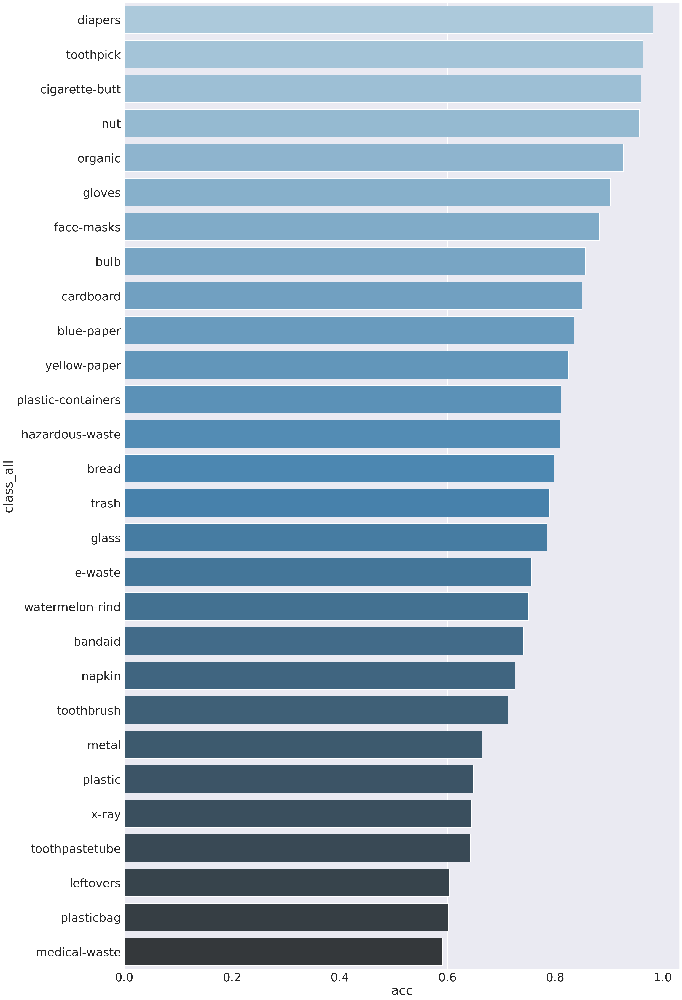

In [67]:
#sn.set_theme(style="darkgrid")
sns.set(rc={'figure.figsize':(28,50)})
sns.set(font_scale = 3)
df_acc_class = pd.DataFrame(data=[class_acu,all.classes]).T
df_acc_class = df_acc_class.rename(columns={0: 'acc', 1: 'class_all'})
ax = sns.barplot(x=df_acc_class['acc'], y=df_acc_class['class_all'],palette="Blues_d",order=df_acc_class.sort_values('acc',ascending = False).class_all)
df_model_squeeze_net = df_acc_class 

## E.1.3. Confusion Martix for Squeeze Net

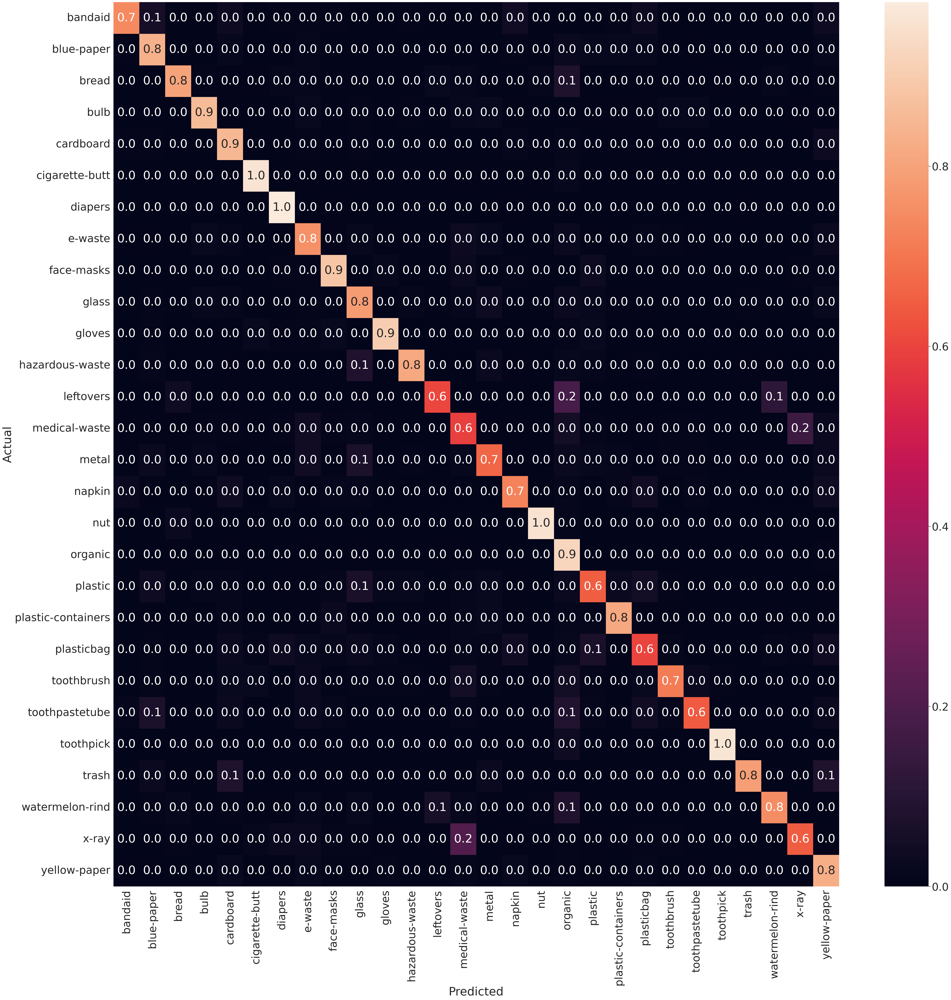

In [68]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)
# Normalise
sns.set(font_scale = 3)
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(50,50))
sns.heatmap(cmn, annot=True, fmt='.1f', xticklabels=classes, yticklabels=classes)
plt.ylabel('Actual')
plt.xlabel('Predicted')

plt.savefig('model_squeeze_net_heatmap.png')
plt.show(block=False)

# F. Overall compare class-wise accuracy

In [94]:
df_combine = df_model_vgg.merge(df_model_resnet18, on='class_all', how='left')
df_combine = df_combine.rename(columns={"acc_x":"acc_vgg", "acc_y":"acc_resnet"})
df_combine = df_combine.merge(df_model_inceptionv3, on='class_all', how='left')
df_combine = df_combine.rename(columns={"acc":"acc_inception"})
df_combine = df_combine.merge(df_model_squeeze_net, on='class_all', how='left')
df_combine = df_combine.rename(columns={"acc":"acc_squeeze"})
df_combine = df_combine.fillna(0)

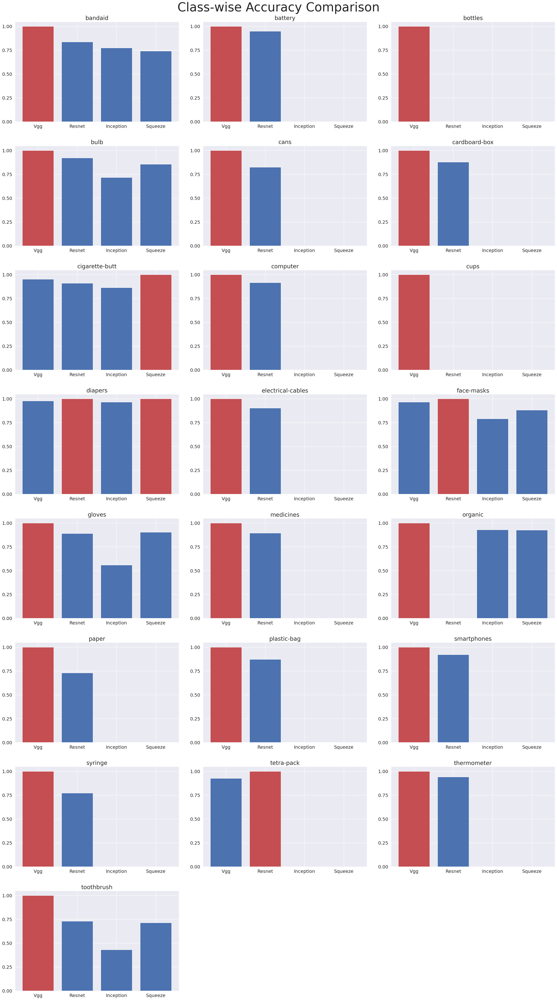

In [110]:
#def plot_class_accuracy():
#    plt.bar(x=["Vgg","Resnet","Inception","Squeeze"],height=[x1,x2,x3,x4])
    
for plot_bar in range(0,22):
    
    plt.subplot(8,3,plot_bar+1)
    
    x1 = df_combine['acc_vgg'][plot_bar]
    x2 = df_combine['acc_resnet'][plot_bar]
    x3 = df_combine['acc_inception'][plot_bar]
    x4 = df_combine['acc_squeeze'][plot_bar]
    
    max_acc = max([x1,x2,x3,x4])
    
    
    plt.bar(x=["Vgg","Resnet","Inception","Squeeze"],height=[x1,x2,x3,x4])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.title(df_combine['class_all'][plot_bar], fontsize=20)
    
    if x1== max_acc:
        plt.bar([0], [1], color='r')
    
    if x2== max_acc:
        plt.bar([1], [1], color='r')
    
    if x3== max_acc:
        plt.bar([2], [1], color='r')
    
    if x4== max_acc:
        plt.bar([3], [1], color='r')
        
    plt.suptitle("Class-wise Accuracy Comparison")   
    plt.tight_layout()
    #plt.show()
    #plot_class_accuracy()